# Instructions for using this notebook
To use this notebook, follow the instructions below to first install the required libraries. Once all the libraries are place, you can run the notebook by pressing the play button to run just one cell. To run the whole notebook use the double play button and click okay in the dialog that appears.
## Required libraries
1\. PYROSM <br>
2\. PANDAS <br>
3\. GEOPANDAS <br>
4\. GEOJSON <br>
5\. GEOJSONIO <br>
6\. JSON
### Install the libraries
if any library is missing, please use the intructions below to install them. If the instructions are note here then do a goole search with the reported error log for it. That should help.
#### Instructions for installing PYROSM
To perform the installation, please follow the instructions in the link:
__https://pyrosm.readthedocs.io/en/latest/installation.html__
#### Instructions for PANDAS
if Pandas is not already installed, follow the instructions in the link (use pip as instructed in the page): __https://pandas.pydata.org/docs/getting_started/install.html__ 
#### Instructions for GEOPANDAS
Usually the installation of PYROSM will install GEOPANDAS. if GEOPANDAS is not already installed, follow the instructions in the link (use pip as instructed in the page): __https://geopandas.org/en/stable/getting_started/install.html__
#### Instructions for GEOJSON
if GEOJSON is not already installed, follow the instructions in the link (use pip as instructed in the page): __https://pypi.org/project/geojson/__
#### Instructions for GEOJSONIO
This libray is used to display data in geojson format in map through the link: __https://geojson.io/#map=2/20.0/0.0__ <br>
To install GEOJSONIO, follow the instruction in the link: __https://pypi.org/project/geojsonio/__
#### Instructions for JSON
if it is not already in your Python environment then use: pip install json 

In [1]:
# import the needed libraries. The import is global
from pyrosm import OSM
from pyrosm import get_data

import geopandas
import pandas as pd

import geojson
from geojson import Feature
from geojson import FeatureCollection
import geojsonio

import json

from geojson import LineString
from geojson import MultiLineString

import pika

import shapely.wkt


/home/oosifo/anaconda3/lib/python3.9/site-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
# set the file containing the map data.
osm = OSM("/mnt/c/dev/data/openstreetmap-data/test_data_gothenburg_slinga_2.pbf")

In [3]:
# Read road networks from the map
drive_net = osm.get_network(network_type="driving")

# Explore the data loaded from the map file

## Check the first 10 rows read from the file

In [4]:
drive_net.head(10)

,access,area,bicycle,bridge,cycleway,foot,highway,int_ref,junction,lanes,...,tunnel,turn,width,id,timestamp,version,tags,osm_type,geometry,length
0,None,None,None,None,None,None,residential,None,None,None,...,None,None,None,3678945,0,-1,None,way,"MULTILINESTRING ((12.15126 57.70713, 12.15103 ...",112.0
1,None,None,None,None,None,None,motorway_link,None,None,1,...,None,None,None,3846609,0,-1,"{""destination"":""G\u00F6teborg"",""destination:re...",way,"MULTILINESTRING ((12.09217 57.67335, 12.09196 ...",52.0
2,None,None,None,None,None,None,motorway,E 20,None,1,...,None,None,None,4040439,0,-1,"{""destination"":""Stockholm""}",way,"MULTILINESTRING ((11.99543 57.71262, 11.99525 ...",422.0
3,None,None,None,None,None,None,motorway,E 20,None,3,...,None,None,None,4040441,0,-1,"{""bus:lanes"":""||designated""}",way,"MULTILINESTRING ((12.00350 57.72114, 12.00262 ...",88.0
4,None,None,None,None,None,None,motorway,E 06,None,2,...,None,None,None,4040443,0,-1,"{""destination"":""Oslo;Hamnar""}",way,"MULTILINESTRING ((11.99543 57.71262, 11.99530 ...",285.0
5,None,None,None,None,None,None,motorway,E 20,None,2,...,None,None,None,4040446,0,-1,None,way,"MULTILINESTRING ((11.99419 57.71349, 11.99426 ...",134.0
6,None,None,None,yes,None,None,motorway_link,None,None,1,...,None,None,None,4040452,0,-1,"{""layer"":""1""}",way,"MULTILINESTRING ((11.99382 57.71518, 11.99321 ...",53.0
7,None,None,None,None,None,None,motorway_link,None,None,1,...,None,None,None,4040453,0,-1,None,way,"MULTILINESTRING ((11.99494 57.71575, 11.99435 ...",92.0
8,None,None,None,None,None,None,motorway,E 20,None,1,...,None,None,None,4040484,0,-1,"{""destination"":""Malm\u00F6;Centrum"",""destinati...",way,"MULTILINESTRING ((11.99494 57.71575, 11.99461 ...",231.0
9,no,None,None,None,None,None,service,None,None,None,...,None,None,None,4040493,0,-1,"{""bus"":""yes""}",way,"MULTILINESTRING ((11.99255 57.71434, 11.99236 ...",111.0


## Check the last 10 rows of data read from the file

In [5]:
drive_net.tail(10)

,access,area,bicycle,bridge,cycleway,foot,highway,int_ref,junction,lanes,...,tunnel,turn,width,id,timestamp,version,tags,osm_type,geometry,length
12618,None,None,None,None,None,None,service,None,None,None,...,None,None,None,1078341813,0,-1,None,way,"MULTILINESTRING ((12.00373 57.67813, 12.00365 ...",12.0
12619,None,None,None,None,None,None,residential,None,None,None,...,None,None,None,1078986680,0,-1,None,way,"MULTILINESTRING ((11.99415 57.69991, 11.99458 ...",25.0
12620,None,None,None,None,None,None,service,None,None,None,...,None,None,None,1080648693,0,-1,None,way,"MULTILINESTRING ((12.00604 57.67066, 12.00614 ...",20.0
12621,None,None,None,None,None,None,service,None,None,None,...,None,None,None,1080998753,0,-1,None,way,"MULTILINESTRING ((11.97087 57.69234, 11.97101 ...",14.0
12622,None,None,None,None,None,None,residential,None,None,2,...,None,None,None,1081024443,0,-1,"{""parking:lane:left"":""parallel"",""parking:lane:...",way,"MULTILINESTRING ((12.00547 57.72190, 12.00493 ...",43.0
12623,None,None,None,None,None,None,residential,None,None,None,...,None,None,None,1081024444,0,-1,None,way,"MULTILINESTRING ((12.00523 57.72060, 12.00536 ...",8.0
12624,None,None,None,None,None,None,residential,None,None,None,...,None,None,None,1081024445,0,-1,"{""parking:lane:both"":""parallel"",""parking:lane:...",way,"MULTILINESTRING ((12.00410 57.72070, 12.00510 ...",61.0
12625,None,None,None,None,None,None,residential,None,None,None,...,None,None,None,1081024446,0,-1,"{""parking:lane:right"":""parallel"",""parking:lane...",way,"MULTILINESTRING ((12.00510 57.72061, 12.00523 ...",7.0
12626,None,None,None,None,None,None,residential,None,None,None,...,None,None,None,1081024447,0,-1,None,way,"MULTILINESTRING ((12.00364 57.72073, 12.00386 ...",13.0
12627,None,None,None,None,None,None,residential,None,None,2,...,None,None,None,1081024451,0,-1,None,way,"MULTILINESTRING ((12.00566 57.72199, 12.00547 ...",15.0


## Check the first row

In [6]:
first_row = drive_net.iloc[0]

In [7]:
print(first_row)

access                                                        None
area                                                          None
bicycle                                                       None
bridge                                                        None
cycleway                                                      None
foot                                                          None
highway                                                residential
int_ref                                                       None
junction                                                      None
lanes                                                         None
lit                                                           None
maxspeed                                                        30
motorcar                                                      None
motorroad                                                     None
motor_vehicle                                                 

/home/oosifo/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/inference.py:383: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
/home/oosifo/anaconda3/lib/python3.9/site-packages/pandas/core/dtypes/inference.py:384: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  len(obj)  # Has a length associated with it.
/home/oosifo/anaconda3/lib/python3.9/site-packages/pandas/io/formats/printing.py:117: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  s = iter(seq)
/home/oosifo/anaconda3/lib/pyth

## Check the data type for the data structure that contains the map data

In [8]:
type(drive_net)

geopandas.geodataframe.GeoDataFrame

## Check the information about the columns of data in the data structure

In [9]:
drive_net.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 12628 entries, 0 to 12627
Data columns (total 35 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   access         749 non-null    object  
 1   area           7 non-null      object  
 2   bicycle        198 non-null    object  
 3   bridge         329 non-null    object  
 4   cycleway       31 non-null     object  
 5   foot           199 non-null    object  
 6   highway        12628 non-null  object  
 7   int_ref        332 non-null    object  
 8   junction       187 non-null    object  
 9   lanes          2570 non-null   object  
 10  lit            1648 non-null   object  
 11  maxspeed       4576 non-null   object  
 12  motorcar       3 non-null      object  
 13  motorroad      7 non-null      object  
 14  motor_vehicle  99 non-null     object  
 15  name           6011 non-null   object  
 16  oneway         3696 non-null   object  
 17  psv            456 non-

## Check the road network data that was downloaded from the map data file
Plot the data with longitudes in the horizontal axis and latitudes in the vertical axis

<AxesSubplot:>

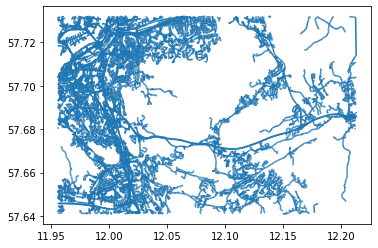

In [10]:
drive_net.plot()

## Superpose the road network data over a map to get an intuitive feeling for the data. The map is interctive

In [11]:
drive_net.explore()

# Create Methods to filter and extract the road network in the "slingan" in Gothenburg

In [12]:
def row_meets_criteria(\
           row: geopandas.geodataframe.GeoDataFrame, \
           id_list: list, \
           ref_list: list,\
           selected_road_names: list, \
           class_list: list) -> bool:
    
    if row.name in selected_road_names and row.highway in class_list:
        return True
    elif str(row.ref) in ref_list and row.highway in class_list:
        return True
    elif row.id in id_list and row.highway in class_list:
        return True
    return False

In [13]:
def get_line_string(geom: MultiLineString) -> LineString:
    line = list()
    for p in geom.geoms:
        line.append(p.coords[0])
        line.append(p.coords[1])
    return LineString(line)

In [14]:
selected_road_names = ["Kråketorpsgatan", "kungsbackavägen", "Nämndemansgatan", "Göteborgsvägen", \
                       "Gamlakungsbackavägen", "Mölndalsbro", "Broslättsgatan", "kungsbackaleden", \
                       "Boråsleden", "Nellickevägen", "Mölndalsvägen", "Örgrytevägen"]

ref_list = ["E 6;E 20", "E 6;E 21", "E 45;E 21", "E 6.21", "E 6", "E 20", "E 45", "O 533", "O 514", "O 518"]
id_list = [10906540, 4267338, 10958242]
class_list = ["motorway_link", "motorway", "trunk_link", "trunk", "residential", "primary", "secondary", "tertiary"]

df = pd.DataFrame()
geo_json_data = dict()

cnt = 0
for row in drive_net.itertuples():
    row_is_in_selected_segments =  row_meets_criteria(row, id_list, ref_list, selected_road_names, class_list)
    if row_is_in_selected_segments:
        
        geojson_road_segment = {"properties":{"maxspeed": str(row.maxspeed), \
                                              "bridge":row.bridge, \
                                              "osm_type": row.osm_type, \
                                              "highway": row.highway, \
                                              "tunnel": row.tunnel, \
                                              "oneway": row.oneway, \
                                              "length": str(row.length), \
                                              "lanes": str(row.lanes), \
                                              "osm_id": str(row.id), \
                                              "name": str(row.name), \
                                              "ref": row.ref, \
                                              "int_ref": row.int_ref, \
                                              "tags": row.tags, \
                                              "ad_approved": "yes"
                                             }, \
                                "geometry":  get_line_string(row.geometry)
                    }
        geo_json_data[row.id] = geojson_road_segment
        
        row_data = drive_net.iloc[cnt]
        df = pd.concat([df, row_data.to_frame().transpose()]) # only for exploratory analysis  
    cnt = cnt + 1
    
gdf = geopandas.GeoDataFrame(df) # only for analysis

## Explore the extracted road network data

## plot the extracted road network data in "slingan"

<AxesSubplot:>

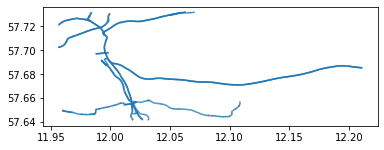

In [15]:
gdf.plot()

## Explore the data for a sample for 2 geojson files from the set of files that were created. 
To see the output from the code below, copy each of the links shown without the single quotes and paste each to the your browser - each at a time - I think.

## Convert and store as Feature Collection in a file 

In [16]:
def create_features_collection():
    features_list = list()
    for key in geo_json_data.keys():
        segment = geo_json_data[key]
        feature = Feature(geometry=segment['geometry'], properties=segment['properties'])
        features_list.append(feature)
    
    features_collection = FeatureCollection(features_list)
    file_name = "test_data_gothenburg_slinga_feature_collection2"+ ".geojson"
    with open(file_name,'w') as f:
        #json.dump(feature, f)
        json.dump(features_collection, f, separators=(',', ':'))
        f.close()
    return features_collection

features_collection = create_features_collection()


In [17]:
print(features_collection)

{"features": [{"geometry": {"coordinates": [[11.995426, 57.712624], [11.995252, 57.712689], [11.995252, 57.712689], [11.995092, 57.712769], [11.995092, 57.712769], [11.994933, 57.712876], [11.994933, 57.712876], [11.99475, 57.71305], [11.99475, 57.71305], [11.994606, 57.713234], [11.994606, 57.713234], [11.994504, 57.713391], [11.994504, 57.713391], [11.994396, 57.713617], [11.994396, 57.713617], [11.994342, 57.713764], [11.994342, 57.713764], [11.994181, 57.714374], [11.994181, 57.714374], [11.994173, 57.714551], [11.994173, 57.714551], [11.994182, 57.714723], [11.994182, 57.714723], [11.994233, 57.714905], [11.994233, 57.714905], [11.994304, 57.715052], [11.994304, 57.715052], [11.994429, 57.71521], [11.994429, 57.71521], [11.994587, 57.715341], [11.994587, 57.715341], [11.994709, 57.715419], [11.994709, 57.715419], [11.994856, 57.715502], [11.994856, 57.715502], [11.9953, 57.715754], [11.9953, 57.715754], [11.995685, 57.715958]], "type": "LineString"}, "properties": {"ad_approved": 